In [8]:
import sys
import os
sys.path.append(os.path.abspath('../src'))

# 1. Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from data.load_data import load_excel_data
from data.clean_data import clean_data
from data.split_data import time_series_split

# Ubah path ke file kamu
file_path = '../data/raw/dataset original.xlsx'

# Load data
df = load_excel_data(file_path)

# Bersihkan data
df_cleaned = clean_data(df)

# Bagi data menjadi train dan test
train, test = time_series_split(df_cleaned)



In [9]:
from models.evaluate import MAPE, MAPE_setiap_periode
from models.holt_winters import holt
from models.ga_optimizer import  algoritma_genetika6, to_decimal

# 1. Implementasi GA
# train, test, jumlah populasi, jumlah iterasi, probabilitas kemunculan mutasi pada iterasi ke-N
best_individu_generasi, generations, fitness_history  = algoritma_genetika6(train, test, 100, 1000, 10)
# print('Daftar Individu terbaik tiap generasi:', real_populasi)

print("Individu Terbaik di Seluruh Generasi", best_individu_generasi)
#  ubah ke decimal
alpha_decimal = to_decimal(best_individu_generasi['Alpha'])
beta_decimal = to_decimal(best_individu_generasi['Beta'])
gamma_decimal = to_decimal(best_individu_generasi['Gamma'])

# 3. Implementasi Holt-Winters
periode_uji, ramalan_periode, ramalan = holt(train, alpha_decimal, beta_decimal, gamma_decimal)

mape = MAPE(test, ramalan_periode)
MAPE_setiap_periode = MAPE_setiap_periode(test, ramalan_periode)
print('Hasil peramalan tahun 2023: ', ramalan_periode)
print('Hasil peramalan setiap periode: ', MAPE_setiap_periode)
print('Dengan hasil MAPE: ', mape)

Pembentukan populasi awal:  [{'Alpha': '1110111001', 'Beta': '1010101011', 'Gamma': '0110001001', 'Fitness': None}, {'Alpha': '1010100110', 'Beta': '1111010001', 'Gamma': '1011000011', 'Fitness': None}, {'Alpha': '1111010001', 'Beta': '1110100110', 'Gamma': '1100011110', 'Fitness': None}, {'Alpha': '1001101101', 'Beta': '1100000000', 'Gamma': '1100100010', 'Fitness': None}, {'Alpha': '1101000111', 'Beta': '1100100000', 'Gamma': '1100101100', 'Fitness': None}, {'Alpha': '0111111110', 'Beta': '0110000001', 'Gamma': '0011010100', 'Fitness': None}, {'Alpha': '1110011001', 'Beta': '1001101111', 'Gamma': '0110001110', 'Fitness': None}, {'Alpha': '1100000010', 'Beta': '0001100010', 'Gamma': '0001110011', 'Fitness': None}, {'Alpha': '0100001110', 'Beta': '1001011100', 'Gamma': '0001011010', 'Fitness': None}, {'Alpha': '0100001110', 'Beta': '1100011110', 'Gamma': '0010100010', 'Fitness': None}, {'Alpha': '1100101101', 'Beta': '1011010011', 'Gamma': '0011000110', 'Fitness': None}, {'Alpha': '100

In [10]:
mape_list_rounded = [round(x,2) for x in MAPE_setiap_periode]


bulan_nama = ['Januari', 'Februari', 'Maret', 'April', 'Mei', 'Juni',
    'Juli', 'Agustus', 'September', 'Oktober', 'November', 'Desember']

df = pd.DataFrame({
    'Bulan': bulan_nama,
    'Data aktual 2023': test,
    'Peramalan 2023': ramalan_periode,
    'MAPE (%)': mape_list_rounded,
})

file_path = '../data/final/hasil_ramalan.xlsx'
df.to_excel(file_path, index=False)

print(f"File Excel berhasil disimpan di {file_path}!")

File Excel berhasil disimpan di ../data/final/hasil_ramalan.xlsx!


In [11]:
df = load_excel_data(file_path)

df

,Bulan,Data aktual 2023,Peramalan 2023,MAPE (%)
0,Januari,1419611,1.396233e+06,1.65
1,Februari,1295180,1.055095e+06,18.54
2,Maret,1452671,1.301151e+06,10.43
3,April,1490809,1.351698e+06,9.33
4,Mei,1645124,1.397326e+06,15.06
5,Juni,1608563,1.457877e+06,9.37
6,Juli,1737637,1.753362e+06,0.90
7,Agustus,1525937,1.683836e+06,10.35
8,September,1468845,1.620969e+06,10.36
9,Oktober,1582366,1.570268e+06,0.76


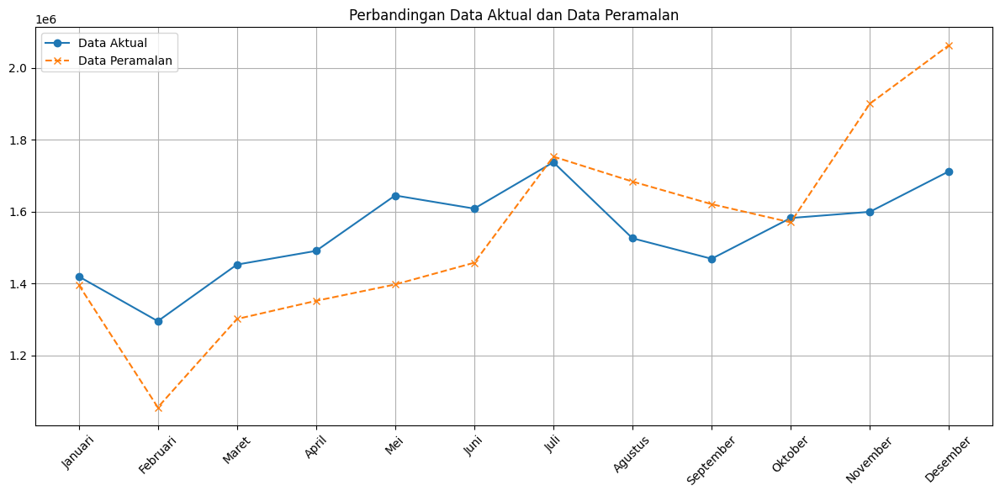

In [12]:
# Menampilkan grafik prediksi ke depan
plt.figure(figsize=(12, 6))
plt.plot(df['Bulan'], df['Data aktual 2023'], label='Data Aktual', marker='o')
plt.plot(df['Bulan'], df['Peramalan 2023'], label='Data Peramalan', marker='x', linestyle='--')

plt.title("Perbandingan Data Aktual dan Data Peramalan")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [13]:

Q1 = df['Peramalan 2023'].quantile(0.25)
Q3 = df['Peramalan 2023'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

df = df[(df['Peramalan 2023'] >= lower_bound) & (df['Peramalan 2023'] <= upper_bound)]
    
# Mengganti outlier dengan nilai mean
mean_value = df['Data aktual 2023'].mean()
df['Peramalan 2023'] = df['Peramalan 2023'].apply(lambda x: mean_value if x < lower_bound or x > upper_bound else x)

df

,Bulan,Data aktual 2023,Peramalan 2023,MAPE (%)
0,Januari,1419611,1.396233e+06,1.65
1,Februari,1295180,1.055095e+06,18.54
2,Maret,1452671,1.301151e+06,10.43
3,April,1490809,1.351698e+06,9.33
4,Mei,1645124,1.397326e+06,15.06
5,Juni,1608563,1.457877e+06,9.37
6,Juli,1737637,1.753362e+06,0.90
7,Agustus,1525937,1.683836e+06,10.35
8,September,1468845,1.620969e+06,10.36
9,Oktober,1582366,1.570268e+06,0.76


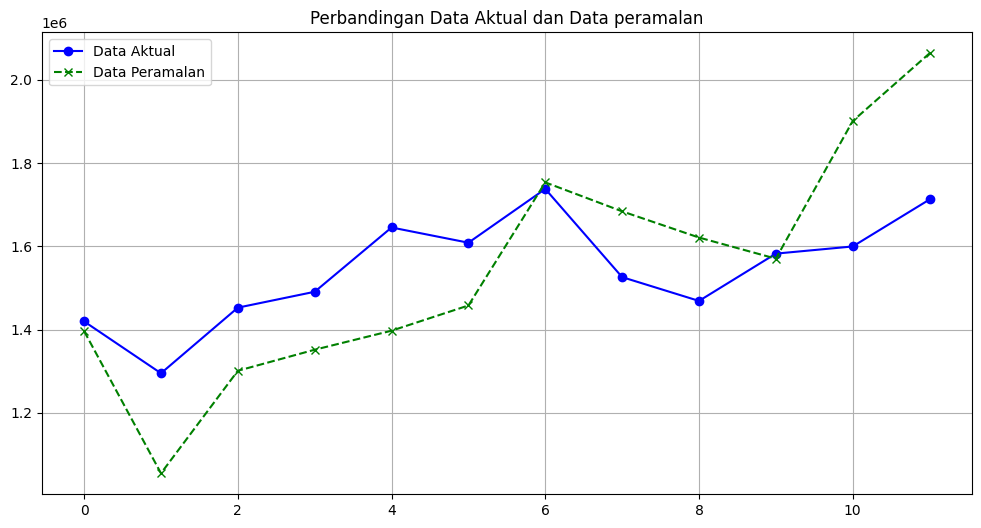

In [14]:
# Menampilkan grafik prediksi ke depan
plt.figure(figsize=(12, 6))
plt.plot(range(len(df['Data aktual 2023'])), df['Data aktual 2023'], label='Data Aktual', marker='o', linestyle='-', color='blue')
plt.plot(range(len(df['Peramalan 2023'])), df['Peramalan 2023'], label='Data Peramalan', marker='x', linestyle='--', color='green')
plt.title("Perbandingan Data Aktual dan Data peramalan")
plt.legend()
plt.grid(True)
plt.show()